In [1]:
import os
import sys

# Add project root to Python path for module imports (needed for unpickling StyleGAN2)
project_root = '/home/jz2003/ECS289H/posthoc-generative-cbm'
if project_root not in sys.path:
    sys.path.insert(0, project_root)

# Set the current working directory
os.chdir(project_root)
print(f"Current working directory: {os.getcwd()}")
from utils.utils import save_image_grid_with_labels, get_concept_index
import argparse
import numpy as np
from pathlib import Path
import yaml
import torch
from ast import literal_eval
from torch.autograd import Variable
from torchvision.utils import save_image, make_grid
import torch.nn.functional as F
from torch import nn
from models import cbae_stygan2
from torchvision import transforms, models
from utils import gan_loss
import itertools
import warnings
import pickle
import matplotlib.pyplot as plt
from tqdm import tqdm
from eval.eval_intervention_gan import opt_int
import time

Current working directory: /home/jz2003/ECS289H/posthoc-generative-cbm


### Setup

* The next code block sets up the hyperparameters for the visualization.
* Use `optint=True` to use optimization-based interventions and `optint=False` for CB-AE interventions.
* Select target concept from:
    - Smiling
    - Mouth_Slightly_Open
    - Male
    - Arched_Eyebrows
    - Heavy_Makeup
    - High_Cheekbones
    - Wearing_Lipstick
    - Attractive
* Use `concept_value=1` for intervention target to be target concept (e.g. Smiling) and `concept_value=0` for opposite of target concept (e.g. Not Smiling).

In [ ]:
# dataset to evaluate on
dataset = 'celebahq'
# experiment name
expt_name = 'cc_stygan2'
# tensorboard name
tensorboard_name = 'sup_pl_unk40_cls8'
# whether to use optimization-based interventions
optint = True
optint_eps = 0.1
optint_iters = 50

# target concept and target value (desired concept to intervene on), e.g. "Smiling", "Mouth_Slightly_Open", "Male"
target_concept = 'Male'
## e.g. 0 or 1 (since all concepts in CelebA-HQ are binary)
concept_value = 1

clsf_model_type = 'rn18'
device = 'cuda:0'

### Load generative model with CB-AE

In [3]:
config_file = f"./config/{expt_name}/"+dataset+".yaml"

with open(config_file, 'r') as stream:
    config = yaml.safe_load(stream)
print(f"Loaded configuration file {config_file}")

Loaded configuration file ./config/cbae_stygan2_thr90/celebahq.yaml


In [ ]:
num_cls = 8
set_of_classes = [
    ['NOT Attractive', 'Attractive'],
    ['NO Lipstick', 'Wearing Lipstick'],
    ['Mouth Closed', 'Mouth Slightly Open'],
    ['NOT Smiling', 'Smiling'],
    ['Low Cheekbones', 'High Cheekbones'],
    ['NO Makeup', 'Heavy Makeup'],
    ['Female', 'Male'],
    ['Straight Eyebrows', 'Arched Eyebrows']
]
conc_clsf_classes = [
    'Attractive',
    'Wearing_Lipstick',
    'Mouth_Slightly_Open',
    'Smiling',
    'High_Cheekbones',
    'Heavy_Makeup',
    'Male',
    'Arched_Eyebrows',
]

concept_change = conc_clsf_classes.index(target_concept)
config['model']['pretrained'] = 'models/checkpoints/stylegan2-celebahq-256x256.pkl'
model = cbae_stygan2.cbAE_StyGAN2(config)

cbae_ckpt_path = f'models/checkpoints/{dataset}_{expt_name}.pt'

model.cbae.load_state_dict(torch.load(cbae_ckpt_path, map_location='cpu'))
model.to(device)
model.eval();

loading stylegan2 from models/checkpoints/stylegan2-celebahq-256x256.pkl
Total concepts (including unknown): 56
number of layers in CB-AE: 20


### Load concept classifier to evaluate concept interventions

In [5]:
if clsf_model_type == 'rn18':
    con_clsf = models.resnet18(weights='DEFAULT')
    num_features = con_clsf.fc.in_features
    con_clsf.fc = nn.Linear(num_features, 2) # binary classification (num_of_class == 2)
elif clsf_model_type == 'rn50':
    con_clsf = models.resnet50(weights='DEFAULT')
    num_features = con_clsf.fc.in_features
    con_clsf.fc = nn.Linear(num_features, 2) # binary classification (num_of_class == 2)
elif clsf_model_type == 'vit_l_16':
    con_clsf = models.vit_l_16(weights='ViT_L_16_Weights.IMAGENET1K_SWAG_E2E_V1')
    num_features = con_clsf.heads.head.in_features
    con_clsf.heads = nn.Linear(num_features, 2)

con_clsf.load_state_dict(torch.load(f'models/checkpoints/{dataset}_{target_concept}_{clsf_model_type}_conclsf.pth', map_location='cpu'))
print(f'loading concept classifier from models/checkpoints/{dataset}_{target_concept}_{clsf_model_type}_conclsf.pth')
con_clsf = con_clsf.to(device)
con_clsf.eval()

tf_conclsf = transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
if clsf_model_type == 'vit_l_16':
    ### generated by chatgpt
    class ResizeNormalizeTransform:
        def __init__(self, resize_size=(512, 512), mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]):
            self.resize_size = resize_size
            self.normalize = transforms.Normalize(mean, std)

        def __call__(self, img_tensor):
            # Resize the tensor using interpolate (for BxCxHxW input)
            img_tensor = F.interpolate(img_tensor, size=self.resize_size, mode='bilinear', align_corners=False)
            # Normalize the tensor
            return self.normalize(img_tensor)

    tf_conclsf = ResizeNormalizeTransform()

loading concept classifier from models/checkpoints/celebahq_Male_rn18_conclsf.pth


### Perform concept interventions

In [6]:
batch_size = 3
num_steps = 3

orig_images_list = []
interv_images_list = []
for idx in tqdm(range(num_steps)):
    # intervene on one selected concept with selected value
    concept_change = concept_change
    concept_value = concept_value

    # Sample noise and labels as generator input
    z = torch.randn((batch_size, model.gen.z_dim), device=device)
    latent = model.gen.mapping(z, None, truncation_psi=1.0, truncation_cutoff=None)


    if optint:
        recon_latent = latent.detach().clone()
        new_latent = opt_int(model, latent, concept_change, concept_value, num_iters=optint_iters, eps=optint_eps, device=device)

    # demo_old_concepts = model.cbae.enc(latent)
    # demo_new_concepts = model.cbae.enc(new_latent)

    # print(f"Old concepts: {demo_old_concepts}")
    # print(f"New concepts: {demo_new_concepts}")
    
    # old_concept_values, old_concept_probs = _extract_concept_values(model, demo_old_concepts, 8)
    # new_concept_values, new_concept_probs = _extract_concept_values(model, demo_new_concepts, 8)

    # print(f"old probabilities: {old_concept_probs}")
    # print(f"new probabilities: {new_concept_probs}")

    concepts = model.cbae.enc(latent)

    new_concepts = concepts.clone()

    start, end = get_concept_index(model, concept_change)
    c_concepts = concepts[:, start:end]
    _, num_c = c_concepts.shape

    # swapping the max value to the concept we need
    new_c_concepts = c_concepts.clone()
    old_vals = new_c_concepts[:, concept_value].clone()
    max_val, max_ind = torch.max(new_c_concepts, dim=1)
    new_c_concepts[:, concept_value] = max_val
    for swap_idx, (curr_ind, curr_old_val) in enumerate(zip(max_ind, old_vals)):
        new_c_concepts[swap_idx, curr_ind] = curr_old_val

    new_concepts[:, start:end] = new_c_concepts

    if not optint:
        new_latent = model.cbae.dec(new_concepts)
    recon_latent = model.cbae.dec(concepts)

    # Generate a batch of images
    gen_imgs_latent = model.gen.synthesis(new_latent, noise_mode='const')
    gen_imgs_latent_orig = model.gen.synthesis(recon_latent, noise_mode='const')

    gen_imgs_latent = gen_imgs_latent.mul(0.5).add_(0.5)
    gen_imgs_latent_orig = gen_imgs_latent_orig.mul(0.5).add_(0.5)

    # converting it to the normalization required by ResNet18 concept classifier
    gen_imgs_latent_cc = tf_conclsf(gen_imgs_latent)
    gen_imgs_latent_orig_cc = tf_conclsf(gen_imgs_latent_orig)

    interv_pred = con_clsf(gen_imgs_latent_cc).argmax(dim=1)
    recon_pred = con_clsf(gen_imgs_latent_orig_cc).argmax(dim=1)

    # pick out samples which do not have the desired concept value (to see change with intervention)
    curr_mask = (recon_pred != concept_value)
    if gen_imgs_latent.data[curr_mask].numel() != 0:
        orig_imgs = save_image_grid_with_labels(gen_imgs_latent_orig.data[curr_mask], recon_pred[curr_mask], set_of_classes[concept_change], grid_size=(4, 4), file_name=None, return_images=True).detach().cpu()
        interv_imgs = save_image_grid_with_labels(gen_imgs_latent.data[curr_mask], interv_pred[curr_mask], set_of_classes[concept_change], grid_size=(4, 4), file_name=None, return_images=True).detach().cpu()
        orig_images_list.append(orig_imgs)
        interv_images_list.append(interv_imgs)

orig_images = torch.cat(orig_images_list, dim=0)
interv_images = torch.cat(interv_images_list, dim=0)

orig_grid = make_grid(orig_images[:64], nrow=8, padding=2, normalize=True)
interv_grid = make_grid(interv_images[:64], nrow=8, padding=2, normalize=True)

  0%|          | 0/3 [00:00<?, ?it/s]

Setting up PyTorch plugin "bias_act_plugin"... Done.
Setting up PyTorch plugin "upfirdn2d_plugin"... 

100%|██████████| 3/3 [00:02<00:00,  1.45it/s]

Done.


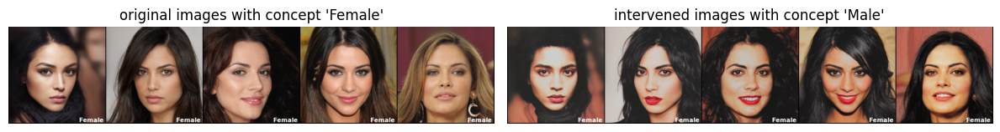

In [7]:
def imshow_grid(grid, title, ax):
    # Convert from torch tensor to numpy image
    npimg = grid.numpy()
    npimg = np.transpose(npimg, (1, 2, 0))  # CHW to HWC
    ax.imshow(npimg)
    ax.set_title(title)
    ax.axis('off')

fig, axs = plt.subplots(1, 2, figsize=(12, 12))

imshow_grid(orig_grid, f"original images with concept \'{set_of_classes[concept_change][1 - concept_value]}\'", axs[0])
imshow_grid(interv_grid, f"intervened images with concept \'{set_of_classes[concept_change][concept_value]}\'", axs[1])

plt.tight_layout()
plt.show()

### Generate images with all combinations of concepts for a fixed seed



In [42]:
# Set a fixed seed for reproducibility
seed = 42
torch.manual_seed(seed)
np.random.seed(seed)

# Generate a single latent vector from the seed
z = torch.randn((1, model.gen.z_dim), device=device)
latent = model.gen.mapping(z, None, truncation_psi=1.0, truncation_cutoff=None)

# Get the original concepts for this latent
concepts = model.cbae.enc(latent)

# Generate all combinations of 8 binary concepts (2^8 = 256 combinations)
num_concepts = 8
all_combinations = list(itertools.product([0, 1], repeat=num_concepts))

print(f"Total combinations: {len(all_combinations)}")
print(f"Concepts: {conc_clsf_classes}")

# Store all generated images
all_images = []

# Generate images for all combinations
for combo in tqdm(all_combinations):
    new_concepts = concepts.clone()
    
    # Set each concept to the desired value in this combination
    for concept_idx, concept_val in enumerate(combo):
        start, end = get_concept_index(model, concept_idx)
        c_concepts = concepts[:, start:end]
        _, num_c = c_concepts.shape
        
        # Swap the max value to the concept we need
        new_c_concepts = c_concepts.clone()
        old_vals = new_c_concepts[:, concept_val].clone()
        max_val, max_ind = torch.max(new_c_concepts, dim=1)
        new_c_concepts[:, concept_val] = max_val
        for swap_idx, (curr_ind, curr_old_val) in enumerate(zip(max_ind, old_vals)):
            new_c_concepts[swap_idx, curr_ind] = curr_old_val
        
        new_concepts[:, start:end] = new_c_concepts
    
    # Decode and generate image
    new_latent = model.cbae.dec(new_concepts)
    gen_img = model.gen.synthesis(new_latent, noise_mode='const')
    gen_img = gen_img.mul(0.5).add_(0.5)
    
    all_images.append(gen_img.detach().cpu())

# Concatenate all images
all_images_tensor = torch.cat(all_images, dim=0)
print(f"Generated {len(all_images_tensor)} images with shape {all_images_tensor.shape}")


Total combinations: 256
Concepts: ['Attractive', 'Wearing_Lipstick', 'Mouth_Slightly_Open', 'Smiling', 'High_Cheekbones', 'Heavy_Makeup', 'Male', 'Arched_Eyebrows']


100%|██████████| 256/256 [00:05<00:00, 47.97it/s]

Generated 256 images with shape torch.Size([256, 3, 256, 256])


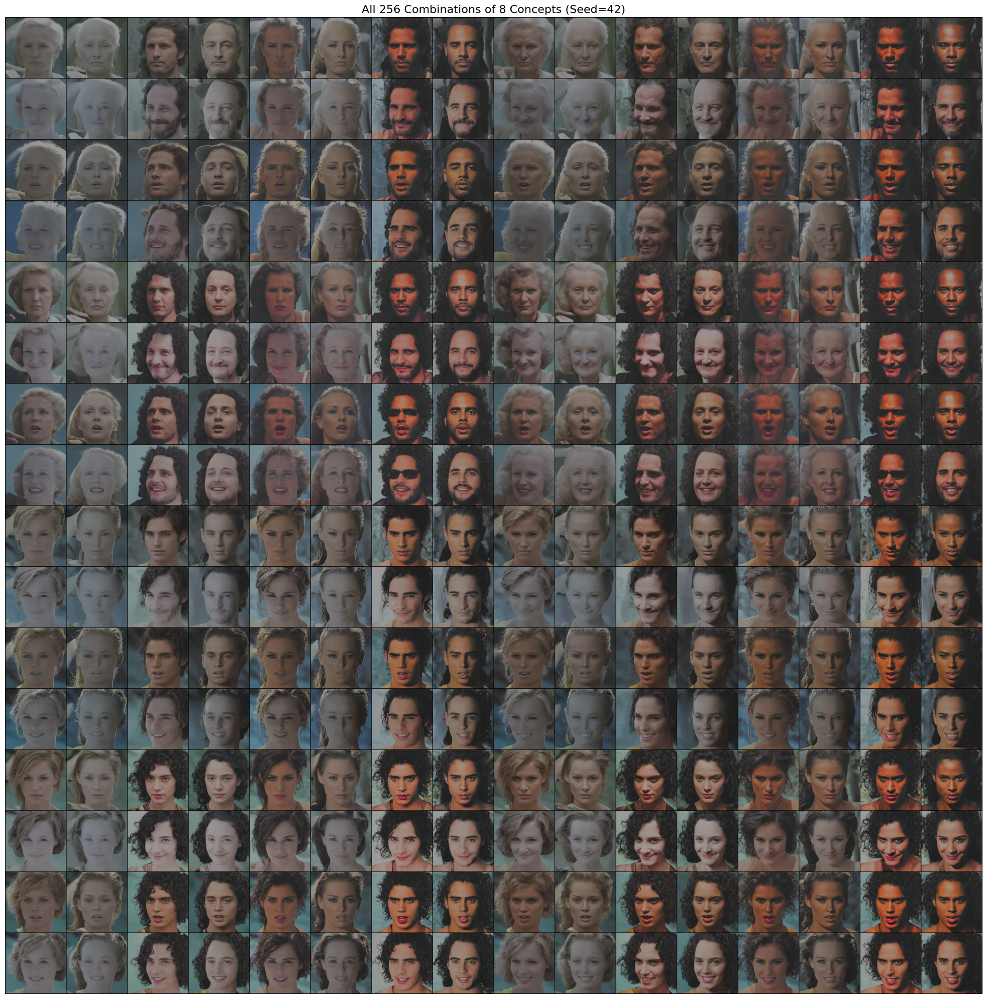


Concepts (in order): ['Attractive', 'Wearing_Lipstick', 'Mouth_Slightly_Open', 'Smiling', 'High_Cheekbones', 'Heavy_Makeup', 'Male', 'Arched_Eyebrows']
Total combinations shown: 256


In [43]:
# Create a grid visualization of all 256 combinations (16x16 grid)
grid = make_grid(all_images_tensor, nrow=16, padding=2, normalize=True)

# Display the grid
fig, ax = plt.subplots(1, 1, figsize=(20, 20))
npimg = grid.numpy()
npimg = np.transpose(npimg, (1, 2, 0))  # CHW to HWC
ax.imshow(npimg)
ax.set_title(f'All 256 Combinations of 8 Concepts (Seed={seed})', fontsize=16)
ax.axis('off')

plt.tight_layout()
plt.show()

print(f"\nConcepts (in order): {conc_clsf_classes}")
print(f"Total combinations shown: {len(all_combinations)}")


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


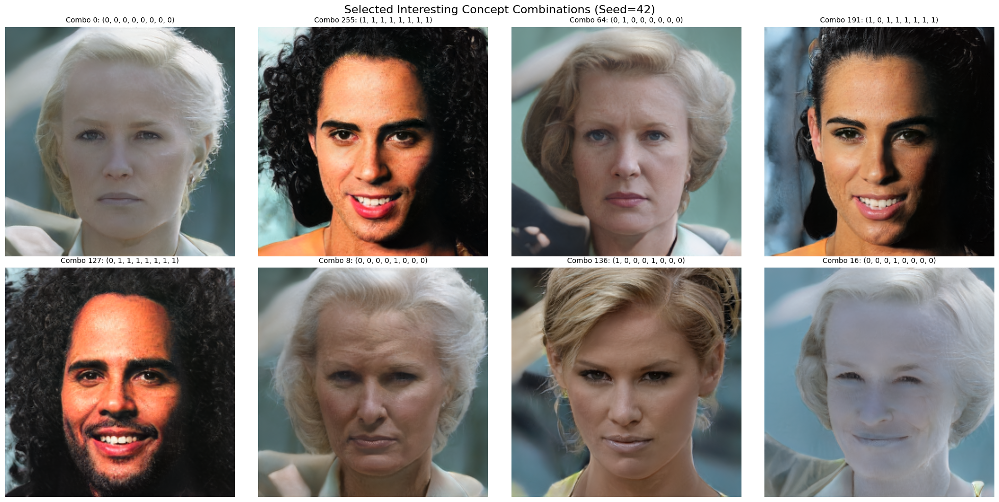

In [44]:
# Visualize a subset of interesting combinations with labels
# Select some specific combinations to highlight
interesting_indices = [
    0,     # All concepts = 0 (NOT Attractive, NO Lipstick, Mouth Closed, NOT Smiling, Low Cheekbones, NO Makeup, Female, Straight Eyebrows)
    255,   # All concepts = 1 (Attractive, Wearing Lipstick, Mouth Slightly Open, Smiling, High Cheekbones, Heavy Makeup, Male, Arched Eyebrows)
    64,    # Only Male (0,0,0,0,0,0,1,0)
    191,   # Male with everything except Attractive (0,1,1,1,1,1,1,1)
    127,   # Female with everything except Male (0,1,1,1,1,1,1,1)
    8,     # Only Smiling (0,0,0,1,0,0,0,0)
    136,   # Only Male and Smiling (0,0,0,1,0,0,1,0)
    16,    # Only High Cheekbones (0,0,0,0,1,0,0,0)
]

# Get images for these indices
interesting_images = [all_images_tensor[i] for i in interesting_indices]
interesting_combos = [all_combinations[i] for i in interesting_indices]

# Create labels for each combination
labels = []
for combo in interesting_combos:
    label_parts = []
    for concept_idx, val in enumerate(combo):
        concept_name = conc_clsf_classes[concept_idx]
        label_parts.append(f"{concept_name}={val}")
    labels.append("\n".join(label_parts))

# Create a grid with subplots
fig, axes = plt.subplots(2, 4, figsize=(20, 10))
axes = axes.flatten()

for i, (img, combo, label) in enumerate(zip(interesting_images, interesting_combos, labels)):
    npimg = img.numpy()
    npimg = np.transpose(npimg, (1, 2, 0))  # CHW to HWC
    axes[i].imshow(npimg)
    axes[i].set_title(f"Combo {interesting_indices[i]}: {combo}", fontsize=10)
    axes[i].axis('off')

plt.suptitle(f'Selected Interesting Concept Combinations (Seed={seed})', fontsize=16)
plt.tight_layout()
plt.show()


In [45]:
seed = [40, 41, 42]
